<a href="https://colab.research.google.com/github/SanyaKapoor/Detection-Of-Deepfakes/blob/main/Deep_Fake_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***Fetching data using the kaggle API***

In [ ]:
!pip install kaggle

In [15]:
!export KAGGLE_USERNAME=sanyakapoor
!export KAGGLE_KEY=9004f54099bb4b2f057a7704d6c1d000

In [16]:
from google.colab import files
u = files.upload()

Saving kaggle.json to kaggle.json


In [19]:
!mv "kaggle.json" "/root/.kaggle/"

# ***Dataset Description***

In [ ]:
# SKLearn Implemention
from sklearn.metrics import log_loss
log_loss(["REAL", "FAKE", "FAKE", "REAL"],
         [[.1, .9], [.9, .1], [.8, .2], [.35, .65]])

0.21616187468057912

In [ ]:
!pip install sk-video

In [ ]:
!pip install IPython

# ***Frame Extraction***

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import cv2
plt.style.use('ggplot')
from IPython.display import *

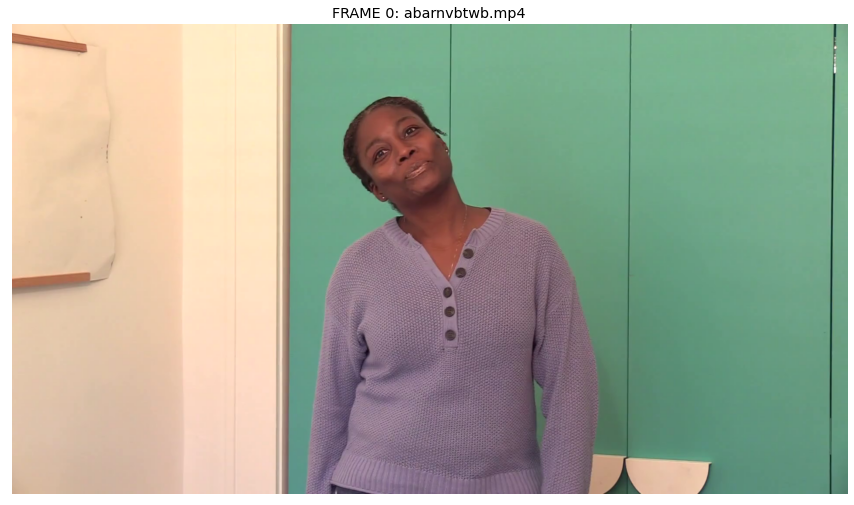

In [ ]:
import cv2 as cv
import os
import matplotlib.pylab as plt
train_dir = '/content'
fig, ax = plt.subplots(1,1, figsize=(15, 15))
train_video_files = [train_dir + x for x in os.listdir(train_dir)]
# video_file = train_video_files[30]
video_file = 'abarnvbtwb.mp4'
cap = cv.VideoCapture(video_file)
success, image = cap.read()
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
cap.release()   
ax.imshow(image)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
ax.title.set_text(f"FRAME 0: {video_file.split('/')[-1]}")
plt.grid(False)

# ***Face Extraction***

In [ ]:
!pip install face_recognition

     |████████████████████████████████| 100.2MB 39kB/s 
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566173 sha256=31e08323df3aef874f17ec2ffd82fc60ca2d6a2aa2a10d7025570ff8eca337c6
  Stored in directory: /root/.cache/pip/wheels/d2/99/18/59c6c8f01e39810415c0e63f5bede7d83dfb0ffc039865465f
Successfully built face-recognition-models


I found 1 face(s) in this photograph.
A face is located at pixel location Top: 217, Left: 365, Bottom: 440, Right: 588


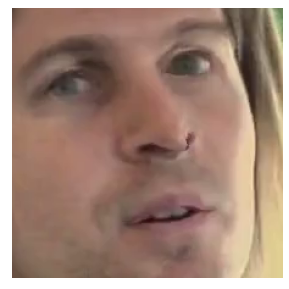

In [ ]:
import face_recognition
face_locations = face_recognition.face_locations(image)

# https://github.com/ageitgey/face_recognition/blob/master/examples/find_faces_in_picture.py
from PIL import Image

print("I found {} face(s) in this photograph.".format(len(face_locations)))

for face_location in face_locations:

    # Print the location of each face in this image
    top, right, bottom, left = face_location
    print("A face is located at pixel location Top: {}, Left: {}, Bottom: {}, Right: {}".format(top, left, bottom, right))

    # You can access the actual face itself like this:
    face_image = image[top:bottom, left:right]
    fig, ax = plt.subplots(1,1, figsize=(5, 5))
    plt.grid(False)
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    ax.imshow(face_image)

## Imports

In [ ]:
!pip install cython

In [ ]:
!sudo apt install cmake

Reading package lists... Done
Building dependency tree       
Reading state information... Done
cmake is already the newest version (3.10.2-1ubuntu2.18.04.1).
0 upgraded, 0 newly installed, 0 to remove and 21 not upgraded.


In [ ]:
!pip3 install face_recognition

     |████████████████████████████████| 100.2MB 52kB/s 
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566173 sha256=110ab25fcd8715ccedc8f423b7dc5edd34664b5423ea9a851713af1c61df37cd
  Stored in directory: /root/.cache/pip/wheels/d2/99/18/59c6c8f01e39810415c0e63f5bede7d83dfb0ffc039865465f
Successfully built face-recognition-models


In [ ]:
!sudo pip install -v --install-option="--no" --install-option="DLIB_USE_CUDA" dlib

/usr/local/lib/python3.6/dist-packages/pip/_internal/commands/install.py:283: UserWarning: Disabling all use of wheels due to the use of --build-options / --global-options / --install-options.
  cmdoptions.check_install_build_global(options)
Created temporary directory: /tmp/pip-ephem-wheel-cache-pwn7l3zv
Created temporary directory: /tmp/pip-req-tracker-7zb7y2e6
Created requirements tracker '/tmp/pip-req-tracker-7zb7y2e6'
Created temporary directory: /tmp/pip-install-48wx8n6k
Cleaning up...
Removed build tracker '/tmp/pip-req-tracker-7zb7y2e6'


In [ ]:
!pip install dlib



# ***Extract Landmarks***

The chin in this face has the following points: [(317, 321), (326, 354), (336, 386), (351, 415), (373, 439), (404, 456), (441, 467), (478, 470), (510, 466), (533, 453), (544, 432), (550, 405), (551, 377), (549, 350), (547, 324), (545, 299), (537, 274)]
The left_eyebrow in this face has the following points: [(365, 277), (380, 258), (402, 245), (428, 241), (452, 245)]
The right_eyebrow in this face has the following points: [(486, 241), (500, 231), (516, 227), (531, 230), (539, 242)]
The nose_bridge in this face has the following points: [(477, 267), (485, 283), (494, 298), (503, 315)]
The nose_tip in this face has the following points: [(473, 344), (487, 345), (500, 345), (508, 341), (514, 336)]
The left_eye in this face has the following points: [(394, 287), (408, 275), (424, 272), (438, 281), (425, 286), (409, 289)]
The right_eye in this face has the following points: [(491, 272), (503, 260), (517, 257), (527, 265), (520, 271), (506, 273)]
The top_lip in this face has the following p

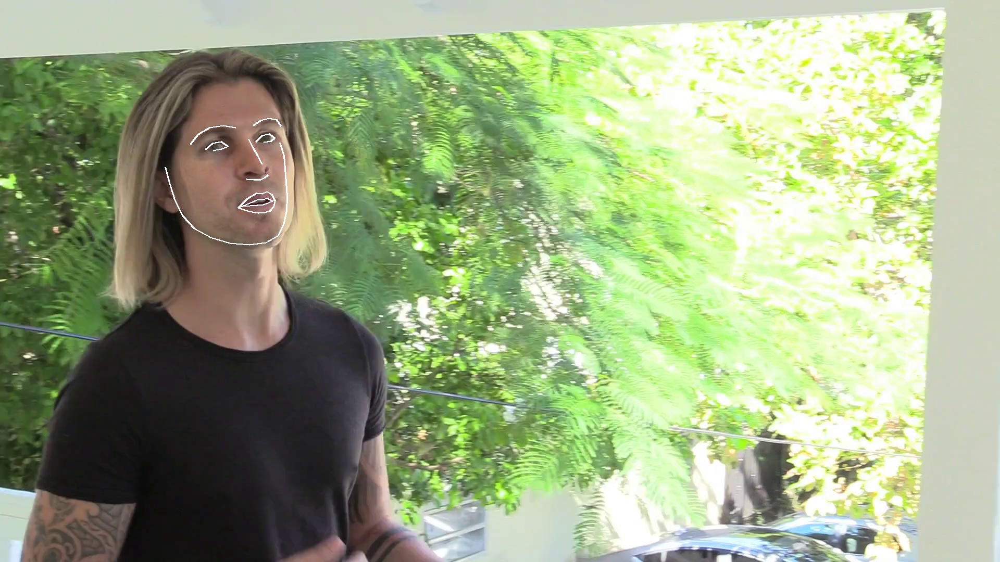

In [ ]:
face_landmarks_list = face_recognition.face_landmarks(image)
# https://github.com/ageitgey/face_recognition/blob/master/examples/find_facial_features_in_picture.py
# face_landmarks_list
from PIL import Image, ImageDraw
pil_image = Image.fromarray(image)
d = ImageDraw.Draw(pil_image)

for face_landmarks in face_landmarks_list:

    # Print the location of each facial feature in this image
    for facial_feature in face_landmarks.keys():
        print("The {} in this face has the following points: {}".format(facial_feature, face_landmarks[facial_feature]))

    # Let's trace out each facial feature in the image with a line!
    for facial_feature in face_landmarks.keys():
        d.line(face_landmarks[facial_feature], width=3)

# Show the picture
display(pil_image)

# ***Data Preprocessing***


In [20]:
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/metadata.json

  0% 0.00/29.6k [00:00<?, ?B/s]
100% 29.6k/29.6k [00:00<00:00, 55.0MB/s]


In [21]:
import pandas as pd
train_sample_metadata = pd.read_json('metadata.json').T
train_sample_metadata.head()

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


In [22]:
data = train_sample_metadata.reset_index()
data.columns = ['videos', 'label', 'split', 'original']
data.head(60)

,videos,label,split,original
0,aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
1,aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
2,abarnvbtwb.mp4,REAL,train,None
3,abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
4,abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4
5,acifjvzvpm.mp4,FAKE,train,kbvibjhfzo.mp4
6,acqfdwsrhi.mp4,FAKE,train,ccfoszqabv.mp4
7,acxnxvbsxk.mp4,FAKE,train,fjlyaizcwc.mp4
8,acxwigylke.mp4,FAKE,train,ffcwhpnpuw.mp4
9,aczrgyricp.mp4,FAKE,train,slwkmefgde.mp4


In [ ]:
i = 0
count = 0
real = []
while(count<10):
  if (data.iloc[i]['label']=='REAL'):
    vid = '/train_sample_videos/' + str(data.iloc[i]['videos'])
    !kaggle competitions download -c deepfake-detection-challenge -f vid
    real.append(vid)
    count = count + 1
  i = i + 1

In [ ]:
i = 0
count = 0
fake = []
while(count<30):
  if (data.iloc[i]['label']=='FAKE'):
    vid = '/train_sample_videos/' + str(data.iloc[i]['videos'])
    !kaggle competitions download -c deepfake-detection-challenge -f vid
    fake.append(vid)
    count = count + 1
  i = i + 1




***Incase the above two cells throw a string exception, try pulling files manually through the kaggle API as given below***

In [ ]:
real = []
fake = []

In [ ]:
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/abarnvbtwb.mp4
real.append('abarnvbtwb.mp4')
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/aelfnikyqj.mp4
real.append('aelfnikyqj.mp4')
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/afoovlsmtx.mp4
real.append('afoovlsmtx.mp4')
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/agrmhtjdlk.mp4
real.append('agrmhtjdlk.mp4')
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/ahqqqilsxt.mp4
real.append('ahqqqilsxt.mp4')

!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/ajqslcypsw.mp4
real.append('ajqslcypsw.mp4')
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/anpuvshzoo.mp4
real.append('anpuvshzoo.mp4')
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/asaxgevnnp.mp4
real.append('asaxgevnnp.mp4')
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/atkdltyyen.mp4
real.append('atkdltyyen.mp4')
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/atvmxvwyns.mp4
real.append('atvmxvwyns.mp4')

100% 4.79M/4.79M [00:00<00:00, 30.3MB/s]

 70% 5.00M/7.12M [00:00<00:00, 45.2MB/s]
100% 7.12M/7.12M [00:00<00:00, 45.6MB/s]
  0% 0.00/3.16M [00:00<?, ?B/s]
100% 3.16M/3.16M [00:00<00:00, 107MB/s]
  0% 0.00/4.21M [00:00<?, ?B/s]
100% 4.21M/4.21M [00:00<00:00, 69.8MB/s]
 62% 5.00M/8.07M [00:00<00:00, 29.6MB/s]
100% 8.07M/8.07M [00:00<00:00, 39.6MB/s]
100% 4.97M/4.97M [00:00<00:00, 31.8MB/s]

100% 4.75M/4.75M [00:00<00:00, 35.7MB/s]

  0% 0.00/3.15M [00:00<?, ?B/s]
100% 3.15M/3.15M [00:00<00:00, 104MB/s]
100% 4.78M/4.78M [00:00<00:00, 43.7MB/s]

  0% 0.00/2.61M [00:00<?, ?B/s]
100% 2.61M/2.61M [00:00<00:00, 87.8MB/s]


In [6]:
fake = ["aorjvbyxhw.mp4",
"apatcsqejh.mp4",
"apgjqzkoma.mp4",
"apogckdfrz.mp4",
"aqpnvjhuzw.mp4",
"arkroixhey.mp4",
"ajwpjhrbcv.mp4",
"aklqzsddfl.mp4",
"aknbdpmgua.mp4",
"aknmpoonls.mp4", 	
"akvmwkdyuv.mp4", 	
"akxoopqjqz.mp4", 
"akzbnazxtz.mp4", 
"aladcziidp.mp4", 
"alaijyygdv.mp4", 	
"alninxcyhg.mp4", 	
"altziddtxi.mp4", 	
"alvgwypubw.mp4", 
"amaivqofda.mp4", 
"amowujxmzc.mp4", 	
"andaxzscny.mp4", 	
"aneclqfpbt.mp4",
"abofeumbvv.mp4",
"abqwwspghj.mp4",
"acifjvzvpm.mp4",
"acqfdwsrhi.mp4",
"acxnxvbsxk.mp4",
"acxwigylke.mp4",
"aczrgyricp.mp4",
"adhsbajydo.mp4"]

In [ ]:
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/aorjvbyxhw.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/apatcsqejh.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/apgjqzkoma.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/apogckdfrz.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/aqpnvjhuzw.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/arkroixhey.mp4

 83% 9.00M/10.8M [00:00<00:00, 16.0MB/s]
100% 10.8M/10.8M [00:00<00:00, 14.8MB/s]
 95% 5.00M/5.27M [00:00<00:00, 23.7MB/s]
100% 5.27M/5.27M [00:00<00:00, 21.0MB/s]
  0% 0.00/3.28M [00:00<?, ?B/s]
100% 3.28M/3.28M [00:00<00:00, 93.6MB/s]
100% 4.77M/4.77M [00:00<00:00, 26.3MB/s]

  0% 0.00/3.34M [00:00<?, ?B/s]
100% 3.34M/3.34M [00:00<00:00, 113MB/s]
  0% 0.00/3.72M [00:00<?, ?B/s]
100% 3.72M/3.72M [00:00<00:00, 125MB/s]


In [ ]:
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/ajwpjhrbcv.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/aklqzsddfl.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/aknbdpmgua.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/aknmpoonls.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/akvmwkdyuv.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/akxoopqjqz.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/akzbnazxtz.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/aladcziidp.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/alaijyygdv.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/alninxcyhg.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/altziddtxi.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/alvgwypubw.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/amaivqofda.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/amowujxmzc.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/andaxzscny.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/aneclqfpbt.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/abofeumbvv.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/abqwwspghj.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/acifjvzvpm.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/acqfdwsrhi.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/acxnxvbsxk.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/acxwigylke.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/aczrgyricp.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/adhsbajydo.mp4

  0% 0.00/3.33M [00:00<?, ?B/s]
100% 3.33M/3.33M [00:00<00:00, 112MB/s]
  0% 0.00/3.23M [00:00<?, ?B/s]
100% 3.23M/3.23M [00:00<00:00, 105MB/s]
100% 4.84M/4.84M [00:00<00:00, 41.2MB/s]

  0% 0.00/3.95M [00:00<?, ?B/s]
100% 3.95M/3.95M [00:00<00:00, 133MB/s]
  0% 0.00/2.98M [00:00<?, ?B/s]
100% 2.98M/2.98M [00:00<00:00, 97.9MB/s]
100% 5.00M/5.01M [00:00<00:00, 32.8MB/s]
100% 5.01M/5.01M [00:00<00:00, 32.0MB/s]
  0% 0.00/3.83M [00:00<?, ?B/s]
100% 3.83M/3.83M [00:00<00:00, 129MB/s]
100% 4.59M/4.59M [00:00<00:00, 35.5MB/s]

  0% 0.00/4.17M [00:00<?, ?B/s]
100% 4.17M/4.17M [00:00<00:00, 69.2MB/s]
  0% 0.00/2.97M [00:00<?, ?B/s]
100% 2.97M/2.97M [00:00<00:00, 91.8MB/s]
100% 5.00M/5.01M [00:00<00:00, 7.07MB/s]
100% 5.01M/5.01M [00:00<00:00, 6.87MB/s]
  0% 0.00/3.42M [00:00<?, ?B/s]
100% 3.42M/3.42M [00:00<00:00, 115MB/s]
  0% 0.00/3.25M [00:00<?, ?B/s]
100% 3.25M/3.25M [00:00<00:00, 108MB/s]
  0% 0.00/3.21M [00:00<?, ?B/s]
100% 3.21M/3.21M [00:00<00:00, 106MB/s]
  0% 0.00/2.65M [00:00<?, ?B/

In [ ]:
!ls

abarnvbtwb.mp4.zip  agrmhtjdlk.mp4.zip	alaijyygdv.mp4.zip  apgjqzkoma.mp4.zip
abofeumbvv.mp4.zip  ahqqqilsxt.mp4.zip	alninxcyhg.mp4.zip  apogckdfrz.mp4.zip
abqwwspghj.mp4.zip  ajqslcypsw.mp4.zip	altziddtxi.mp4.zip  aqpnvjhuzw.mp4.zip
acifjvzvpm.mp4.zip  ajwpjhrbcv.mp4.zip	alvgwypubw.mp4.zip  arkroixhey.mp4.zip
acqfdwsrhi.mp4.zip  aklqzsddfl.mp4.zip	amaivqofda.mp4.zip  asaxgevnnp.mp4.zip
acxnxvbsxk.mp4.zip  aknbdpmgua.mp4.zip	amowujxmzc.mp4.zip  atkdltyyen.mp4.zip
acxwigylke.mp4.zip  aknmpoonls.mp4.zip	andaxzscny.mp4.zip  atvmxvwyns.mp4.zip
aczrgyricp.mp4.zip  akvmwkdyuv.mp4.zip	aneclqfpbt.mp4.zip  metadata.json
adhsbajydo.mp4.zip  akxoopqjqz.mp4.zip	anpuvshzoo.mp4.zip  sample_data
aelfnikyqj.mp4.zip  akzbnazxtz.mp4.zip	aorjvbyxhw.mp4.zip
afoovlsmtx.mp4.zip  aladcziidp.mp4.zip	apatcsqejh.mp4.zip


In [ ]:
complete = ["afoovlsmtx.mp4.zip", "aladcziidp.mp4.zip", "abarnvbtwb.mp4.zip",  "agrmhtjdlk.mp4.zip",	"alaijyygdv.mp4.zip",  "apgjqzkoma.mp4.zip", "abofeumbvv.mp4.zip",  "ahqqqilsxt.mp4.zip",	"alninxcyhg.mp4.zip",  "apogckdfrz.mp4.zip",
"abqwwspghj.mp4.zip",	"altziddtxi.mp4.zip",  "aqpnvjhuzw.mp4.zip", "acifjvzvpm.mp4.zip",  "ajqslcypsw.mp4.zip",	"alvgwypubw.mp4.zip",  "arkroixhey.mp4.zip", "acqfdwsrhi.mp4.zip",  "ajwpjhrbcv.mp4.zip",	"amaivqofda.mp4.zip",  "asaxgevnnp.mp4.zip",
"acxnxvbsxk.mp4.zip",  "aklqzsddfl.mp4.zip",	"amowujxmzc.mp4.zip", "acxwigylke.mp4.zip",  "aknbdpmgua.mp4.zip",	"andaxzscny.mp4.zip",  "atkdltyyen.mp4.zip",
"aczrgyricp.mp4.zip", "aknmpoonls.mp4.zip",	"aneclqfpbt.mp4.zip",  "atvmxvwyns.mp4.zip","adhsbajydo.mp4.zip,"  "akvmwkdyuv.mp4.zip",	"anpuvshzoo.mp4.zip", "akxoopqjqz.mp4.zip",	"aorjvbyxhw.mp4.zip",  
"aelfnikyqj.mp4.zip",  "akzbnazxtz.mp4.zip",	"apatcsqejh.mp4.zip"]

# ***Facial Landmarks***

In [ ]:
import cv2 as cv
import os
import matplotlib.pylab as plt
from PIL import Image
import face_recognition
from PIL import Image, ImageDraw

In [ ]:
import random
complete = real + fake
random.shuffle(complete)

In [ ]:
for i in complete:
  !unzip $i 

Archive:  aorjvbyxhw.mp4.zip
  inflating: aorjvbyxhw.mp4          
Archive:  apatcsqejh.mp4.zip
  inflating: apatcsqejh.mp4          
Archive:  apgjqzkoma.mp4.zip
  inflating: apgjqzkoma.mp4          
Archive:  apogckdfrz.mp4.zip
  inflating: apogckdfrz.mp4          
Archive:  aqpnvjhuzw.mp4.zip
  inflating: aqpnvjhuzw.mp4          
Archive:  arkroixhey.mp4.zip
  inflating: arkroixhey.mp4          
Archive:  ajwpjhrbcv.mp4.zip
  inflating: ajwpjhrbcv.mp4          
Archive:  aklqzsddfl.mp4.zip
  inflating: aklqzsddfl.mp4          
Archive:  aknbdpmgua.mp4.zip
  inflating: aknbdpmgua.mp4          
Archive:  aknmpoonls.mp4.zip
  inflating: aknmpoonls.mp4          
Archive:  akvmwkdyuv.mp4.zip
  inflating: akvmwkdyuv.mp4          
Archive:  akxoopqjqz.mp4.zip
  inflating: akxoopqjqz.mp4          
Archive:  akzbnazxtz.mp4.zip
  inflating: akzbnazxtz.mp4          
Archive:  aladcziidp.mp4.zip
  inflating: aladcziidp.mp4          
Archive:  alaijyygdv.mp4.zip
  inflating: alaijyygdv.mp4      

A face is located at pixel location Top: 222, Left: 799, Bottom: 407, Right: 985
The chin in this face has the following points: [(805, 349), (819, 366), (833, 382), (849, 395), (866, 405), (887, 410), (911, 409), (937, 404), (959, 393), (977, 379), (990, 365), (1002, 351), (1007, 332), (1005, 310), (998, 287), (987, 266), (976, 245)]
The left_eyebrow in this face has the following points: [(809, 310), (810, 290), (820, 273), (837, 262), (855, 257)]
The right_eyebrow in this face has the following points: [(882, 235), (894, 221), (910, 213), (928, 210), (943, 217)]
The nose_bridge in this face has the following points: [(881, 267), (888, 273), (896, 279), (903, 286)]
The nose_tip in this face has the following points: [(896, 321), (906, 316), (915, 311), (921, 305), (927, 300)]
The left_eye in this face has the following points: [(835, 316), (841, 301), (852, 293), (867, 294), (859, 303), (848, 311)]
The right_eye in this face has the following points: [(906, 264), (911, 250), (922, 24

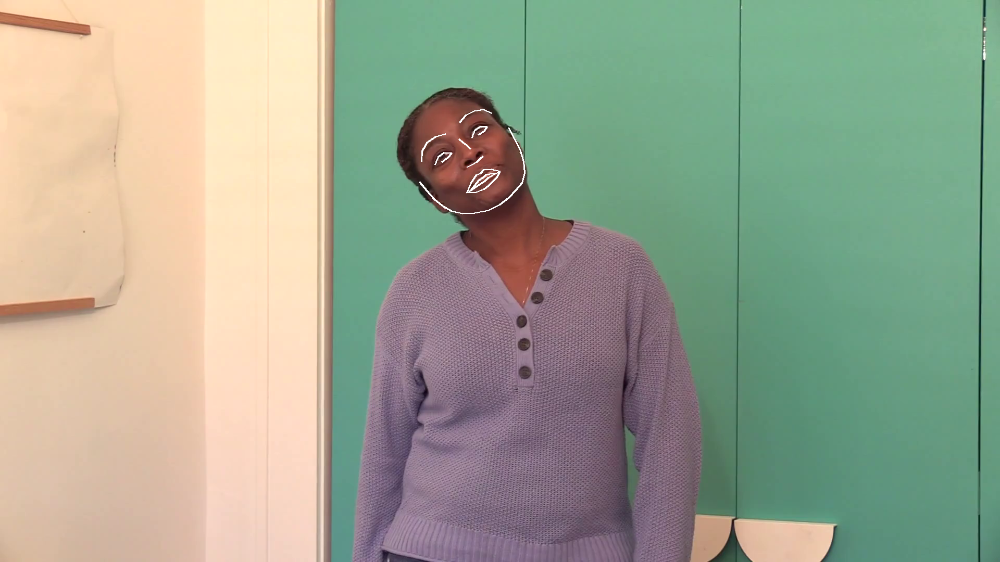

A face is located at pixel location Top: 142, Left: 860, Bottom: 365, Right: 1083
The chin in this face has the following points: [(925, 220), (918, 238), (915, 260), (918, 282), (921, 304), (924, 328), (928, 354), (934, 374), (952, 384), (981, 383), (1015, 376), (1050, 365), (1080, 350), (1104, 328), (1117, 298), (1123, 265), (1129, 234)]
The left_eyebrow in this face has the following points: [(921, 178), (924, 170), (932, 168), (942, 171), (950, 178)]
The right_eyebrow in this face has the following points: [(981, 176), (1002, 170), (1025, 170), (1046, 179), (1062, 193)]
The nose_bridge in this face has the following points: [(961, 211), (954, 224), (945, 237), (936, 251)]
The nose_tip in this face has the following points: [(932, 268), (938, 273), (945, 276), (956, 275), (967, 274)]
The left_eye in this face has the following points: [(930, 216), (936, 211), (945, 212), (954, 216), (945, 220), (936, 220)]
The right_eye in this face has the following points: [(998, 221), (1008, 217)

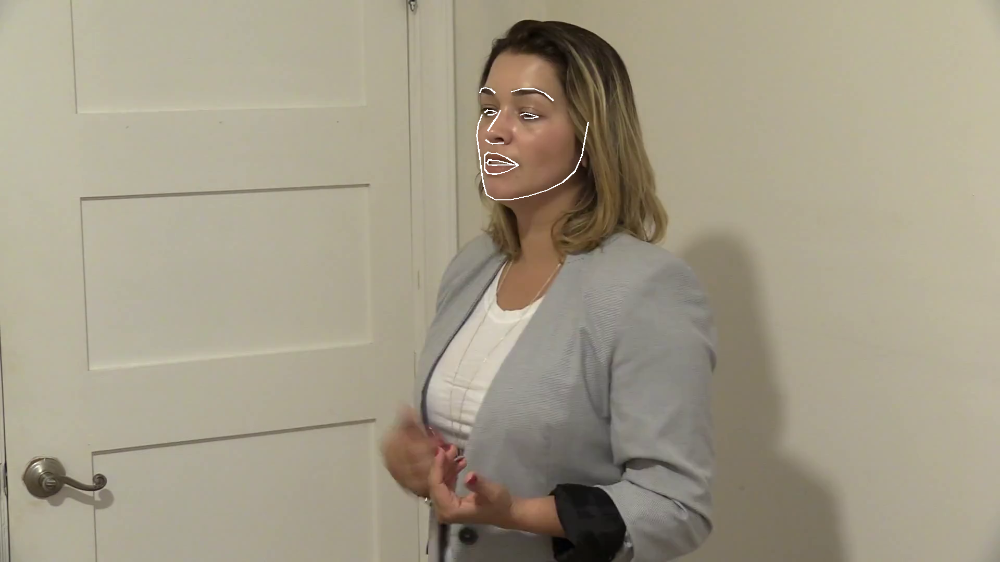

A face is located at pixel location Top: 98, Left: 799, Bottom: 284, Right: 985
The chin in this face has the following points: [(819, 180), (819, 201), (821, 222), (825, 242), (831, 261), (841, 277), (857, 289), (874, 297), (895, 299), (918, 297), (941, 291), (963, 282), (980, 268), (991, 249), (997, 227), (1000, 205), (1002, 181)]
The left_eyebrow in this face has the following points: [(830, 150), (838, 139), (852, 134), (867, 135), (881, 141)]
The right_eyebrow in this face has the following points: [(905, 139), (921, 132), (940, 130), (958, 135), (972, 147)]
The nose_bridge in this face has the following points: [(891, 155), (890, 166), (888, 176), (887, 186)]
The nose_tip in this face has the following points: [(876, 206), (882, 208), (889, 209), (898, 207), (907, 205)]
The left_eye in this face has the following points: [(847, 167), (855, 161), (865, 161), (875, 166), (865, 168), (855, 169)]
The right_eye in this face has the following points: [(919, 164), (928, 158), (939, 158)

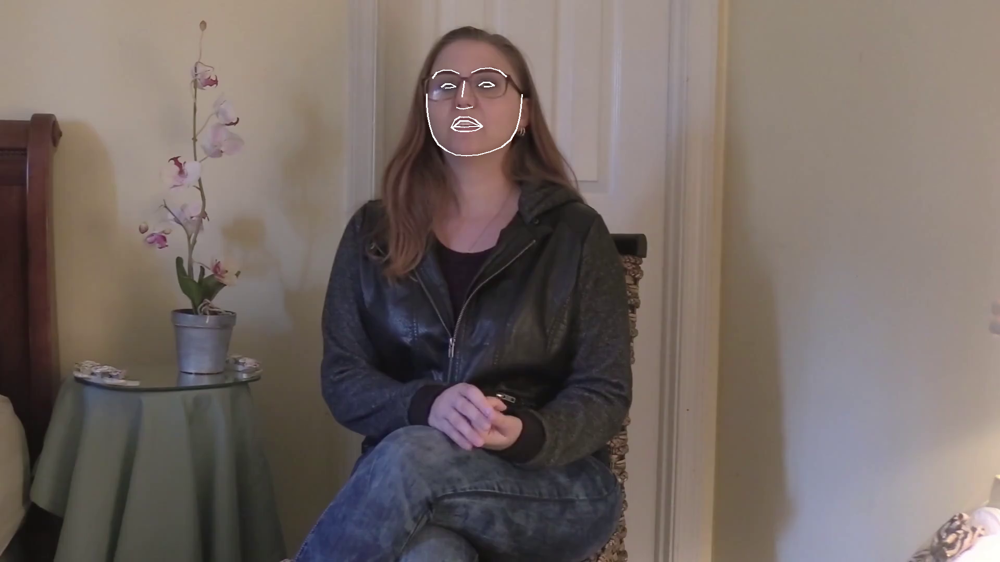

A face is located at pixel location Top: 180, Left: 882, Bottom: 366, Right: 1067
The chin in this face has the following points: [(885, 258), (887, 282), (890, 305), (896, 327), (904, 348), (918, 366), (938, 378), (963, 386), (990, 388), (1014, 383), (1035, 373), (1051, 358), (1061, 339), (1065, 318), (1067, 295), (1069, 273), (1068, 250)]
The left_eyebrow in this face has the following points: [(904, 220), (913, 204), (929, 195), (946, 194), (961, 201)]
The right_eyebrow in this face has the following points: [(999, 199), (1015, 193), (1032, 194), (1047, 202), (1055, 216)]
The nose_bridge in this face has the following points: [(984, 230), (985, 244), (986, 257), (988, 272)]
The nose_tip in this face has the following points: [(968, 289), (978, 291), (988, 293), (997, 290), (1006, 287)]
The left_eye in this face has the following points: [(922, 243), (932, 234), (945, 233), (957, 243), (945, 246), (932, 247)]
The right_eye in this face has the following points: [(1007, 241), (1018, 2

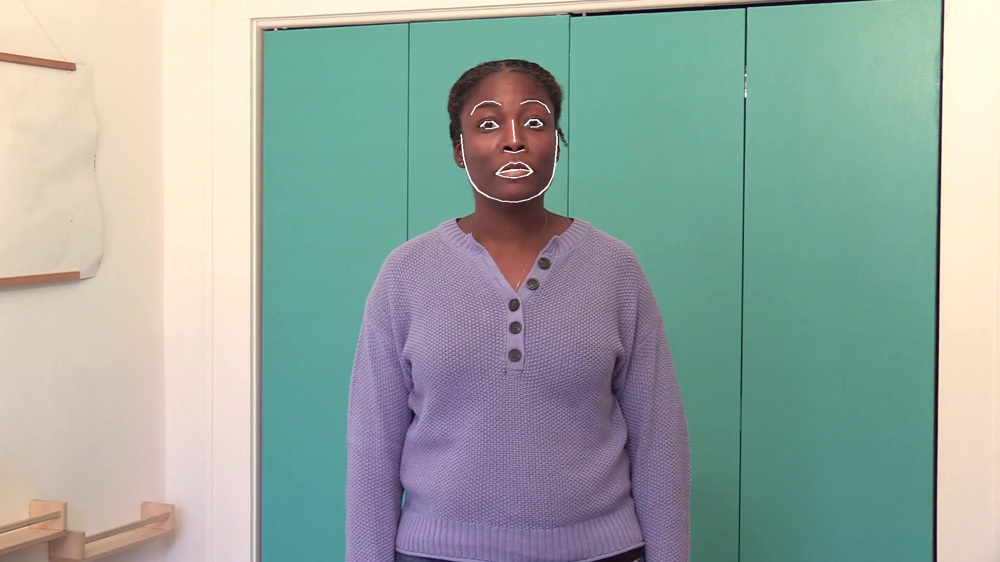

A face is located at pixel location Top: 80, Left: 903, Bottom: 187, Right: 1011
The chin in this face has the following points: [(906, 127), (908, 140), (911, 153), (914, 165), (920, 177), (927, 186), (937, 193), (949, 197), (962, 197), (975, 195), (986, 190), (995, 182), (1001, 172), (1005, 161), (1006, 148), (1006, 134), (1006, 121)]
The left_eyebrow in this face has the following points: [(915, 108), (920, 101), (929, 98), (938, 97), (947, 100)]
The right_eyebrow in this face has the following points: [(963, 99), (972, 95), (981, 94), (989, 96), (996, 102)]
The nose_bridge in this face has the following points: [(956, 108), (956, 115), (957, 122), (957, 130)]
The nose_tip in this face has the following points: [(948, 140), (953, 141), (958, 142), (962, 141), (967, 139)]
The left_eye in this face has the following points: [(925, 114), (930, 109), (937, 108), (943, 113), (937, 114), (930, 115)]
The right_eye in this face has the following points: [(969, 111), (975, 105), (982, 105), 

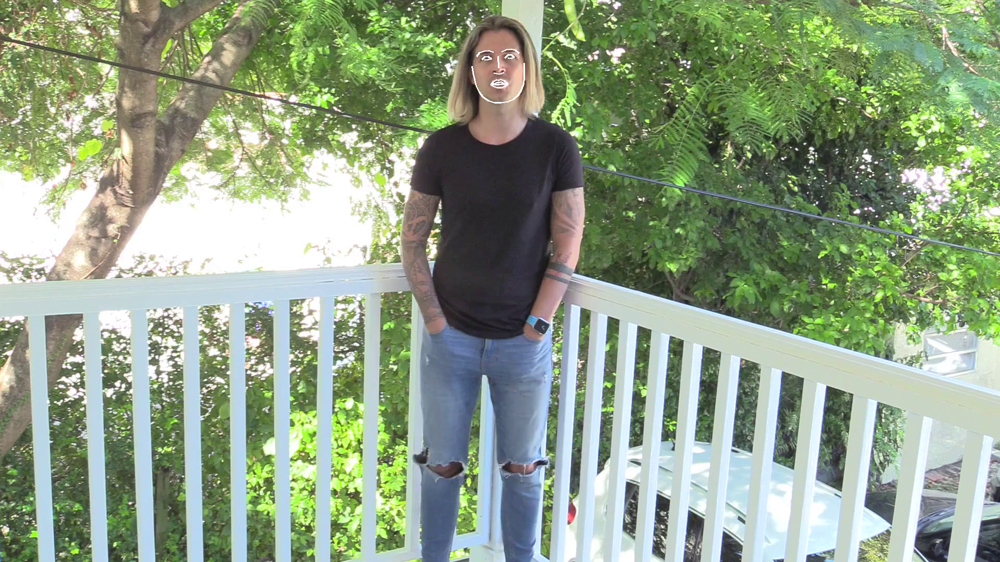

In [ ]:
for i in range(5):
    video_file = complete[i]
    cap = cv.VideoCapture(video_file)
    success, image = cap.read()
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    cap.release()   
    face_locations = face_recognition.face_locations(image)
    for face_location in face_locations:
        # Print the location of each face in this image
        top, right, bottom, left = face_location
        print("A face is located at pixel location Top: {}, Left: {}, Bottom: {}, Right: {}".format(top, left, bottom, right))
        # You can access the actual face itself like this:
        face_image = image[top:bottom, left:right]
    face_landmarks_list = face_recognition.face_landmarks(image)
    pil_image = Image.fromarray(image)
    d = ImageDraw.Draw(pil_image)
    for face_landmarks in face_landmarks_list:
        # Print the location of each facial feature in this image
        for facial_feature in face_landmarks.keys():
            print("The {} in this face has the following points: {}".format(facial_feature, face_landmarks[facial_feature]))
        # Let's trace out each facial feature in the image with a line!
        for facial_feature in face_landmarks.keys():
            d.line(face_landmarks[facial_feature], width=3)
    # Show the picture
    display(pil_image)

In [ ]:
features = []
for facial_feature in face_landmarks.keys():
  features.append(facial_feature)
features

In [ ]:
d = {'video':[], 'chin': [],
 'left_eyebrow':[],
 'right_eyebrow':[],
 'nose_bridge':[],
 'nose_tip':[],
 'left_eye':[],
 'right_eye':[],
 'top_lip':[],
 'bottom_lip':[], 'label': []}
dfinal = pd.DataFrame(data=d)

A face is located at pixel location Top: 92, Left: 939, Bottom: 199, Right: 1047


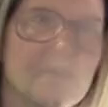

A face is located at pixel location Top: 305, Left: 408, Bottom: 460, Right: 562
The chin in this face has the following points: [(-2, 56), (-1, 75), (-1, 94), (1, 112), (6, 128), (16, 143), (32, 153), (51, 157), (71, 157), (88, 156), (101, 150), (110, 138), (116, 123), (119, 107), (121, 91), (122, 76), (123, 62)]
The left_eyebrow in this face has the following points: [(14, 36), (25, 27), (40, 26), (56, 28), (70, 34)]
The right_eyebrow in this face has the following points: [(84, 37), (96, 34), (107, 33), (117, 35), (125, 42)]
The nose_bridge in this face has the following points: [(78, 48), (79, 58), (80, 68), (82, 79)]
The nose_tip in this face has the following points: [(65, 91), (72, 92), (78, 94), (83, 94), (87, 94)]
The left_eye in this face has the following points: [(31, 48), (39, 45), (48, 45), (55, 50), (47, 51), (38, 51)]
The right_eye in this face has the following points: [(90, 53), (99, 49), (107, 51), (112, 56), (106, 57), (98, 56)]
The top_lip in this face has the foll

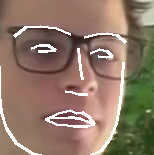

A face is located at pixel location Top: 98, Left: 799, Bottom: 284, Right: 985
The chin in this face has the following points: [(20, 84), (19, 103), (21, 123), (25, 142), (30, 159), (39, 175), (54, 184), (75, 187), (98, 187), (124, 187), (148, 186), (169, 179), (182, 164), (186, 145), (187, 123), (188, 102), (189, 80)]
The left_eyebrow in this face has the following points: [(30, 51), (39, 40), (53, 36), (68, 37), (81, 42)]
The right_eyebrow in this face has the following points: [(107, 41), (122, 34), (140, 32), (157, 37), (171, 47)]
The nose_bridge in this face has the following points: [(92, 58), (91, 68), (90, 78), (89, 89)]
The nose_tip in this face has the following points: [(77, 108), (84, 109), (91, 110), (99, 109), (107, 108)]
The left_eye in this face has the following points: [(46, 69), (55, 64), (65, 63), (75, 68), (65, 71), (55, 71)]
The right_eye in this face has the following points: [(119, 66), (130, 60), (141, 60), (150, 66), (141, 68), (131, 68)]
The top_lip in this 

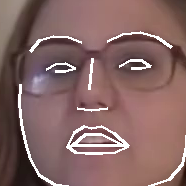

A face is located at pixel location Top: 638, Left: 390, Bottom: 861, Right: 613
The chin in this face has the following points: [(13, 118), (15, 137), (18, 156), (23, 175), (31, 193), (43, 210), (60, 220), (81, 225), (108, 226), (134, 225), (161, 222), (184, 213), (202, 195), (214, 174), (218, 150), (218, 127), (218, 103)]
The left_eyebrow in this face has the following points: [(23, 64), (32, 49), (47, 41), (64, 40), (79, 44)]
The right_eyebrow in this face has the following points: [(109, 39), (126, 29), (147, 29), (167, 36), (182, 49)]
The nose_bridge in this face has the following points: [(95, 59), (95, 69), (95, 78), (94, 88)]
The nose_tip in this face has the following points: [(82, 121), (91, 121), (99, 119), (109, 119), (118, 118)]
The left_eye in this face has the following points: [(38, 83), (48, 74), (62, 71), (75, 78), (63, 81), (49, 84)]
The right_eye in this face has the following points: [(126, 72), (139, 64), (153, 63), (165, 71), (154, 74), (140, 74)]
The top_lip in 

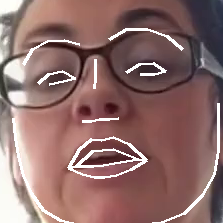

A face is located at pixel location Top: 80, Left: 939, Bottom: 187, Right: 1047


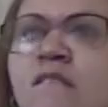

A face is located at pixel location Top: 118, Left: 761, Bottom: 341, Right: 984
The chin in this face has the following points: [(24, 83), (21, 105), (19, 127), (20, 149), (23, 171), (31, 191), (44, 207), (62, 219), (87, 224), (116, 224), (147, 219), (175, 211), (197, 196), (212, 175), (220, 150), (226, 125), (231, 99)]
The left_eyebrow in this face has the following points: [(36, 49), (43, 35), (58, 28), (74, 30), (88, 38)]
The right_eyebrow in this face has the following points: [(113, 34), (135, 27), (158, 28), (179, 37), (193, 55)]
The nose_bridge in this face has the following points: [(97, 53), (93, 63), (88, 72), (84, 82)]
The nose_tip in this face has the following points: [(73, 104), (79, 106), (86, 107), (96, 106), (107, 105)]
The left_eye in this face has the following points: [(52, 65), (60, 57), (71, 56), (82, 62), (71, 65), (60, 66)]
The right_eye in this face has the following points: [(129, 63), (142, 57), (154, 58), (166, 67), (153, 67), (141, 66)]
The top_lip in this

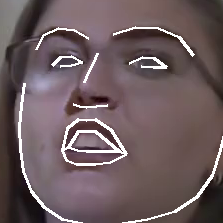

A face is located at pixel location Top: 67, Left: 812, Bottom: 196, Right: 941
The chin in this face has the following points: [(12, 43), (12, 58), (13, 72), (15, 87), (19, 101), (25, 114), (35, 123), (48, 129), (63, 130), (80, 129), (96, 124), (110, 116), (120, 105), (127, 91), (130, 75), (131, 59), (132, 43)]
The left_eyebrow in this face has the following points: [(19, 27), (25, 20), (34, 19), (44, 20), (53, 24)]
The right_eyebrow in this face has the following points: [(71, 23), (82, 19), (95, 17), (107, 20), (115, 28)]
The nose_bridge in this face has the following points: [(62, 35), (61, 44), (60, 52), (59, 61)]
The nose_tip in this face has the following points: [(51, 71), (55, 73), (60, 74), (66, 73), (71, 72)]
The left_eye in this face has the following points: [(31, 39), (36, 35), (43, 35), (50, 39), (43, 41), (36, 41)]
The right_eye in this face has the following points: [(80, 39), (87, 34), (94, 35), (101, 38), (94, 41), (87, 41)]
The top_lip in this face has the following

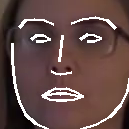

A face is located at pixel location Top: 139, Left: 1005, Bottom: 325, Right: 1191
The chin in this face has the following points: [(-2, 54), (-4, 77), (-3, 101), (0, 125), (9, 148), (23, 168), (41, 184), (63, 194), (87, 196), (111, 194), (134, 186), (153, 171), (168, 152), (177, 130), (183, 108), (185, 85), (187, 62)]
The left_eyebrow in this face has the following points: [(19, 28), (33, 19), (50, 18), (67, 21), (81, 29)]
The right_eyebrow in this face has the following points: [(107, 32), (123, 27), (139, 26), (154, 30), (165, 40)]
The nose_bridge in this face has the following points: [(93, 48), (93, 64), (93, 78), (93, 94)]
The nose_tip in this face has the following points: [(70, 105), (80, 109), (91, 112), (102, 110), (112, 107)]
The left_eye in this face has the following points: [(35, 47), (46, 43), (58, 44), (68, 51), (57, 52), (46, 51)]
The right_eye in this face has the following points: [(116, 55), (127, 50), (139, 52), (149, 58), (138, 59), (127, 58)]
The top_lip in this 

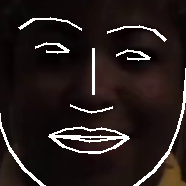

A face is located at pixel location Top: 201, Left: 943, Bottom: 468, Right: 1211
The chin in this face has the following points: [(35, 98), (35, 127), (39, 157), (44, 186), (55, 213), (71, 238), (91, 259), (115, 273), (143, 277), (172, 274), (200, 261), (225, 242), (246, 217), (259, 188), (266, 157), (268, 126), (269, 93)]
The left_eyebrow in this face has the following points: [(50, 63), (59, 46), (77, 38), (96, 41), (114, 49)]
The right_eyebrow in this face has the following points: [(160, 48), (179, 39), (201, 35), (221, 41), (235, 57)]
The nose_bridge in this face has the following points: [(136, 80), (135, 96), (134, 111), (133, 127)]
The nose_tip in this face has the following points: [(111, 151), (123, 154), (135, 156), (149, 153), (162, 151)]
The left_eye in this face has the following points: [(69, 92), (81, 84), (97, 84), (111, 93), (97, 97), (81, 98)]
The right_eye in this face has the following points: [(170, 91), (184, 82), (200, 81), (213, 89), (201, 94), (185, 95)]
The 

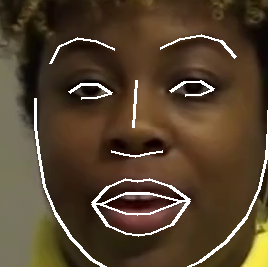

A face is located at pixel location Top: 192, Left: 835, Bottom: 415, Right: 1058
The chin in this face has the following points: [(22, 100), (27, 122), (33, 144), (41, 164), (51, 184), (66, 202), (83, 216), (103, 225), (125, 226), (148, 220), (169, 207), (187, 189), (200, 168), (208, 144), (210, 119), (209, 94), (208, 69)]
The left_eyebrow in this face has the following points: [(29, 66), (36, 50), (50, 41), (67, 38), (82, 42)]
The right_eyebrow in this face has the following points: [(114, 37), (129, 29), (147, 26), (165, 30), (179, 42)]
The nose_bridge in this face has the following points: [(101, 66), (102, 80), (104, 92), (105, 106)]
The nose_tip in this face has the following points: [(91, 125), (100, 127), (110, 127), (120, 123), (129, 120)]
The left_eye in this face has the following points: [(48, 87), (57, 80), (68, 77), (80, 80), (70, 85), (59, 88)]
The right_eye in this face has the following points: [(130, 71), (140, 65), (151, 64), (163, 67), (153, 71), (141, 73)]
The top_

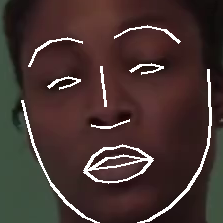

A face is located at pixel location Top: 96, Left: 841, Bottom: 225, Right: 970
The chin in this face has the following points: [(17, 50), (17, 63), (17, 77), (19, 91), (23, 104), (29, 116), (39, 124), (51, 130), (67, 131), (82, 130), (96, 126), (108, 117), (118, 106), (124, 93), (128, 78), (130, 63), (131, 48)]
The left_eyebrow in this face has the following points: [(24, 33), (30, 25), (39, 22), (49, 23), (58, 27)]
The right_eyebrow in this face has the following points: [(73, 25), (84, 20), (95, 19), (107, 22), (114, 30)]
The nose_bridge in this face has the following points: [(66, 39), (66, 46), (65, 53), (64, 61)]
The nose_tip in this face has the following points: [(55, 72), (60, 74), (66, 75), (72, 74), (78, 72)]
The left_eye in this face has the following points: [(35, 45), (41, 43), (48, 42), (54, 44), (48, 46), (41, 47)]
The right_eye in this face has the following points: [(83, 43), (90, 41), (96, 42), (103, 44), (96, 45), (89, 45)]
The top_lip in this face has the following

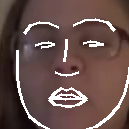

A face is located at pixel location Top: 99, Left: 1168, Bottom: 420, Right: 1489
The chin in this face has the following points: [(79, 144), (79, 172), (82, 201), (89, 230), (101, 258), (116, 285), (132, 310), (152, 328), (176, 332), (206, 327), (237, 312), (265, 290), (290, 264), (308, 233), (316, 198), (316, 163), (314, 128)]
The left_eyebrow in this face has the following points: [(82, 100), (89, 85), (104, 81), (121, 84), (137, 91)]
The right_eyebrow in this face has the following points: [(176, 85), (195, 73), (217, 67), (240, 71), (259, 83)]
The nose_bridge in this face has the following points: [(156, 121), (156, 137), (154, 153), (153, 169)]
The nose_tip in this face has the following points: [(135, 196), (147, 198), (160, 199), (174, 196), (189, 193)]
The left_eye in this face has the following points: [(96, 136), (105, 127), (119, 126), (135, 133), (121, 139), (106, 140)]
The right_eye in this face has the following points: [(194, 127), (207, 116), (223, 116), (238, 122), (2

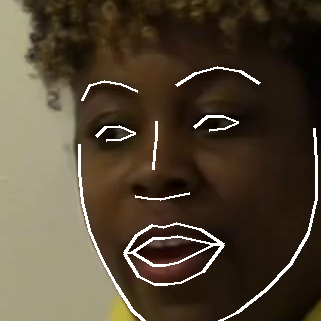

A face is located at pixel location Top: 192, Left: 860, Bottom: 415, Right: 1083
The chin in this face has the following points: [(17, 82), (19, 106), (23, 130), (27, 153), (35, 175), (48, 195), (66, 209), (89, 219), (114, 221), (139, 218), (162, 207), (181, 193), (195, 174), (203, 151), (207, 127), (209, 104), (210, 80)]
The left_eyebrow in this face has the following points: [(33, 49), (43, 34), (60, 28), (78, 29), (94, 36)]
The right_eyebrow in this face has the following points: [(130, 35), (146, 27), (164, 26), (182, 32), (193, 46)]
The nose_bridge in this face has the following points: [(113, 60), (113, 75), (113, 89), (113, 104)]
The nose_tip in this face has the following points: [(92, 120), (103, 123), (114, 124), (125, 122), (135, 119)]
The left_eye in this face has the following points: [(51, 70), (62, 61), (76, 61), (87, 70), (75, 74), (61, 74)]
The right_eye in this face has the following points: [(139, 69), (152, 60), (165, 59), (175, 68), (166, 72), (152, 72)]
The top_l

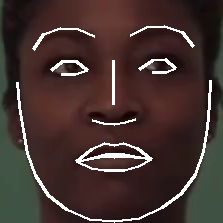

A face is located at pixel location Top: 614, Left: 562, Bottom: 769, Right: 717
The chin in this face has the following points: [(29, 49), (27, 68), (27, 86), (28, 105), (32, 123), (39, 139), (50, 150), (64, 157), (81, 158), (99, 159), (119, 155), (137, 149), (149, 135), (154, 117), (157, 97), (158, 79), (159, 59)]
The left_eyebrow in this face has the following points: [(34, 33), (41, 24), (53, 20), (66, 21), (79, 26)]
The right_eyebrow in this face has the following points: [(98, 28), (112, 23), (126, 23), (140, 27), (149, 38)]
The nose_bridge in this face has the following points: [(85, 41), (83, 51), (81, 60), (78, 70)]
The nose_tip in this face has the following points: [(67, 86), (74, 88), (81, 89), (88, 88), (97, 88)]
The left_eye in this face has the following points: [(43, 45), (51, 41), (60, 41), (69, 47), (59, 48), (50, 47)]
The right_eye in this face has the following points: [(109, 48), (119, 43), (128, 43), (137, 48), (128, 50), (118, 49)]
The top_lip in this face has th

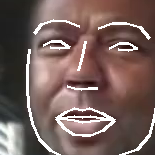

A face is located at pixel location Top: 614, Left: 562, Bottom: 769, Right: 717
The chin in this face has the following points: [(21, 56), (21, 73), (22, 89), (23, 106), (27, 123), (33, 138), (44, 149), (58, 155), (74, 156), (92, 155), (112, 151), (129, 143), (142, 130), (151, 113), (155, 94), (157, 75), (158, 57)]
The left_eyebrow in this face has the following points: [(22, 37), (28, 26), (39, 21), (52, 20), (65, 24)]
The right_eyebrow in this face has the following points: [(81, 24), (96, 19), (112, 18), (127, 24), (137, 36)]
The nose_bridge in this face has the following points: [(71, 39), (69, 48), (67, 56), (65, 66)]
The nose_tip in this face has the following points: [(55, 82), (61, 83), (68, 84), (75, 83), (83, 82)]
The left_eye in this face has the following points: [(33, 48), (39, 43), (47, 43), (56, 46), (47, 48), (39, 49)]
The right_eye in this face has the following points: [(95, 45), (103, 41), (112, 42), (121, 46), (112, 48), (103, 47)]
The top_lip in this face has the 

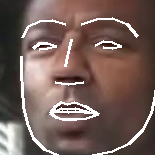

A face is located at pixel location Top: 766, Left: 319, Bottom: 1033, Right: 587
The chin in this face has the following points: [(27, 113), (25, 137), (25, 161), (27, 184), (34, 204), (47, 220), (66, 233), (90, 241), (117, 245), (145, 243), (170, 240), (194, 231), (211, 218), (221, 200), (228, 178), (235, 156), (240, 132)]
The left_eyebrow in this face has the following points: [(55, 68), (67, 49), (87, 40), (110, 40), (130, 47)]
The right_eyebrow in this face has the following points: [(142, 49), (164, 45), (188, 51), (207, 64), (217, 84)]
The nose_bridge in this face has the following points: [(130, 67), (127, 74), (123, 81), (120, 90)]
The nose_tip in this face has the following points: [(101, 117), (109, 119), (120, 120), (131, 119), (142, 118)]
The left_eye in this face has the following points: [(73, 79), (84, 70), (96, 71), (106, 81), (95, 81), (83, 80)]
The right_eye in this face has the following points: [(159, 86), (171, 78), (183, 81), (193, 92), (181, 91), (169, 88)]
The 

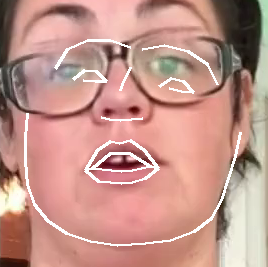

A face is located at pixel location Top: 99, Left: 1168, Bottom: 420, Right: 1489
The chin in this face has the following points: [(80, 143), (78, 170), (80, 199), (88, 227), (98, 255), (114, 282), (131, 305), (151, 322), (177, 326), (207, 321), (238, 306), (267, 286), (292, 262), (310, 231), (318, 197), (317, 161), (315, 127)]
The left_eyebrow in this face has the following points: [(81, 102), (89, 88), (104, 86), (120, 90), (136, 96)]
The right_eyebrow in this face has the following points: [(177, 91), (196, 78), (218, 71), (241, 74), (260, 84)]
The nose_bridge in this face has the following points: [(158, 123), (157, 137), (155, 150), (154, 164)]
The nose_tip in this face has the following points: [(132, 192), (146, 194), (160, 195), (176, 192), (192, 189)]
The left_eye in this face has the following points: [(94, 134), (104, 124), (119, 124), (135, 132), (120, 136), (105, 137)]
The right_eye in this face has the following points: [(196, 126), (209, 113), (226, 113), (242, 120), (22

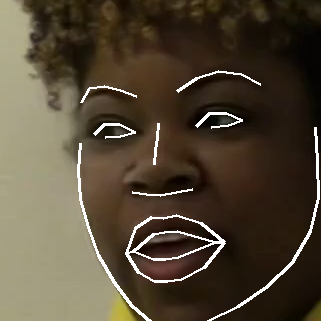

A face is located at pixel location Top: 811, Left: 340, Bottom: 1034, Right: 563
The chin in this face has the following points: [(0, 103), (3, 126), (7, 150), (13, 172), (22, 193), (37, 212), (60, 222), (88, 226), (119, 226), (150, 224), (177, 217), (199, 204), (214, 182), (221, 158), (222, 131), (221, 105), (220, 80)]
The left_eyebrow in this face has the following points: [(16, 56), (24, 40), (40, 29), (61, 24), (80, 29)]
The right_eyebrow in this face has the following points: [(112, 26), (132, 19), (154, 21), (173, 29), (186, 43)]
The nose_bridge in this face has the following points: [(97, 58), (98, 73), (99, 87), (100, 103)]
The nose_tip in this face has the following points: [(84, 126), (94, 128), (104, 129), (114, 126), (125, 123)]
The left_eye in this face has the following points: [(40, 76), (51, 73), (63, 70), (75, 70), (65, 75), (53, 77)]
The right_eye in this face has the following points: [(127, 66), (139, 64), (151, 65), (164, 66), (152, 69), (139, 69)]
The top_lip in 

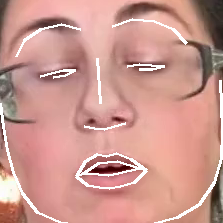

A face is located at pixel location Top: 110, Left: 841, Bottom: 239, Right: 970
The chin in this face has the following points: [(14, 37), (12, 50), (13, 64), (15, 77), (18, 91), (22, 105), (28, 117), (36, 126), (49, 130), (66, 130), (84, 127), (102, 121), (116, 110), (125, 96), (129, 79), (130, 62), (132, 45)]
The left_eyebrow in this face has the following points: [(18, 18), (23, 13), (30, 11), (38, 12), (45, 16)]
The right_eyebrow in this face has the following points: [(68, 16), (78, 12), (90, 12), (102, 16), (111, 22)]
The nose_bridge in this face has the following points: [(54, 33), (51, 41), (49, 49), (46, 57)]
The nose_tip in this face has the following points: [(39, 67), (44, 70), (48, 71), (55, 70), (62, 69)]
The left_eye in this face has the following points: [(26, 36), (32, 34), (39, 34), (45, 37), (38, 39), (31, 39)]
The right_eye in this face has the following points: [(74, 38), (82, 36), (89, 36), (96, 39), (89, 41), (81, 40)]
The top_lip in this face has the following 

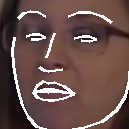

A face is located at pixel location Top: 118, Left: 758, Bottom: 304, Right: 944
The chin in this face has the following points: [(27, 76), (26, 93), (27, 110), (30, 128), (34, 146), (41, 162), (51, 177), (66, 185), (89, 187), (113, 187), (139, 185), (163, 176), (180, 160), (186, 138), (187, 112), (188, 88), (188, 64)]
The left_eyebrow in this face has the following points: [(23, 41), (26, 28), (37, 21), (50, 20), (64, 24)]
The right_eyebrow in this face has the following points: [(93, 19), (110, 13), (129, 13), (146, 20), (160, 33)]
The nose_bridge in this face has the following points: [(77, 44), (75, 56), (72, 67), (70, 78)]
The nose_tip in this face has the following points: [(61, 96), (68, 99), (76, 100), (86, 97), (96, 95)]
The left_eye in this face has the following points: [(34, 58), (41, 52), (51, 50), (62, 53), (52, 56), (42, 58)]
The right_eye in this face has the following points: [(110, 49), (121, 46), (131, 47), (142, 52), (131, 52), (121, 52)]
The top_lip in this face ha

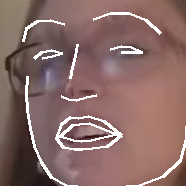

The chin in this face has the following points: [(27, 76), (26, 93), (27, 110), (30, 128), (34, 146), (41, 162), (51, 177), (66, 185), (89, 187), (113, 187), (139, 185), (163, 176), (180, 160), (186, 138), (187, 112), (188, 88), (188, 64)]
The left_eyebrow in this face has the following points: [(23, 41), (26, 28), (37, 21), (50, 20), (64, 24)]
The right_eyebrow in this face has the following points: [(93, 19), (110, 13), (129, 13), (146, 20), (160, 33)]
The nose_bridge in this face has the following points: [(77, 44), (75, 56), (72, 67), (70, 78)]
The nose_tip in this face has the following points: [(61, 96), (68, 99), (76, 100), (86, 97), (96, 95)]
The left_eye in this face has the following points: [(34, 58), (41, 52), (51, 50), (62, 53), (52, 56), (42, 58)]
The right_eye in this face has the following points: [(110, 49), (121, 46), (131, 47), (142, 52), (131, 52), (121, 52)]
The top_lip in this face has the following points: [(56, 138), (61, 124), (70, 117), (78, 118), (88, 116), (

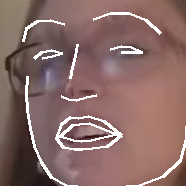

A face is located at pixel location Top: 201, Left: 861, Bottom: 387, Right: 1047
The chin in this face has the following points: [(1, 66), (6, 90), (13, 113), (21, 135), (30, 156), (43, 174), (60, 186), (82, 191), (107, 190), (132, 188), (154, 182), (172, 166), (182, 145), (185, 121), (186, 96), (185, 70), (183, 45)]
The left_eyebrow in this face has the following points: [(4, 24), (11, 8), (26, 1), (42, 2), (57, 9)]
The right_eyebrow in this face has the following points: [(100, 7), (116, -3), (134, -5), (152, 1), (163, 16)]
The nose_bridge in this face has the following points: [(83, 40), (86, 58), (88, 75), (90, 92)]
The nose_tip in this face has the following points: [(71, 108), (82, 110), (93, 111), (104, 107), (114, 103)]
The left_eye in this face has the following points: [(23, 49), (34, 44), (47, 44), (60, 51), (47, 53), (33, 53)]
The right_eye in this face has the following points: [(111, 50), (124, 43), (137, 43), (149, 47), (139, 51), (125, 52)]
The top_lip in this face has

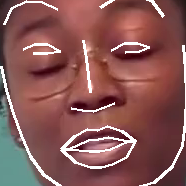

The chin in this face has the following points: [(1, 66), (6, 90), (13, 113), (21, 135), (30, 156), (43, 174), (60, 186), (82, 191), (107, 190), (132, 188), (154, 182), (172, 166), (182, 145), (185, 121), (186, 96), (185, 70), (183, 45)]
The left_eyebrow in this face has the following points: [(4, 24), (11, 8), (26, 1), (42, 2), (57, 9)]
The right_eyebrow in this face has the following points: [(100, 7), (116, -3), (134, -5), (152, 1), (163, 16)]
The nose_bridge in this face has the following points: [(83, 40), (86, 58), (88, 75), (90, 92)]
The nose_tip in this face has the following points: [(71, 108), (82, 110), (93, 111), (104, 107), (114, 103)]
The left_eye in this face has the following points: [(23, 49), (34, 44), (47, 44), (60, 51), (47, 53), (33, 53)]
The right_eye in this face has the following points: [(111, 50), (124, 43), (137, 43), (149, 47), (139, 51), (125, 52)]
The top_lip in this face has the following points: [(61, 149), (74, 136), (87, 129), (97, 130), (107, 126), (1

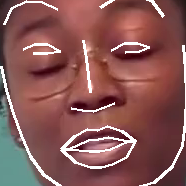

A face is located at pixel location Top: 139, Left: 799, Bottom: 325, Right: 985
The chin in this face has the following points: [(3, 52), (4, 76), (7, 99), (11, 122), (20, 142), (33, 159), (51, 171), (72, 179), (94, 182), (115, 179), (133, 169), (148, 155), (158, 137), (165, 117), (170, 97), (173, 76), (174, 55)]
The left_eyebrow in this face has the following points: [(28, 23), (39, 10), (55, 2), (73, 2), (88, 10)]
The right_eyebrow in this face has the following points: [(120, 13), (132, 6), (146, 6), (158, 13), (164, 27)]
The nose_bridge in this face has the following points: [(103, 34), (104, 47), (104, 59), (105, 72)]
The nose_tip in this face has the following points: [(85, 88), (93, 90), (102, 92), (109, 90), (116, 88)]
The left_eye in this face has the following points: [(47, 40), (57, 33), (68, 34), (78, 41), (68, 44), (56, 44)]
The right_eye in this face has the following points: [(119, 43), (128, 36), (139, 37), (147, 44), (139, 47), (128, 46)]
The top_lip in this face has 

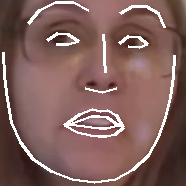

A face is located at pixel location Top: 196, Left: 922, Bottom: 285, Right: 1011
The chin in this face has the following points: [(8, 30), (8, 40), (9, 51), (10, 62), (13, 72), (17, 81), (24, 87), (33, 91), (44, 92), (55, 92), (66, 90), (76, 85), (83, 78), (87, 68), (89, 57), (90, 45), (90, 34)]
The left_eyebrow in this face has the following points: [(14, 12), (19, 6), (26, 5), (32, 6), (39, 10)]
The right_eyebrow in this face has the following points: [(56, 9), (63, 5), (70, 5), (77, 7), (83, 12)]
The nose_bridge in this face has the following points: [(47, 21), (46, 26), (46, 30), (45, 36)]
The nose_tip in this face has the following points: [(35, 46), (40, 47), (46, 47), (51, 47), (56, 46)]
The left_eye in this face has the following points: [(20, 26), (25, 24), (30, 24), (35, 26), (30, 27), (25, 27)]
The right_eye in this face has the following points: [(60, 26), (66, 24), (71, 25), (76, 27), (71, 27), (65, 27)]
The top_lip in this face has the following points: [(27, 67), (33, 6

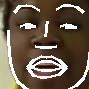

A face is located at pixel location Top: 110, Left: 841, Bottom: 239, Right: 970
The chin in this face has the following points: [(25, 34), (20, 48), (18, 62), (18, 77), (20, 92), (23, 105), (29, 117), (38, 126), (50, 130), (65, 131), (82, 130), (98, 126), (111, 118), (121, 105), (127, 90), (131, 75), (135, 60)]
The left_eyebrow in this face has the following points: [(31, 17), (38, 11), (48, 11), (58, 15), (66, 21)]
The right_eyebrow in this face has the following points: [(82, 25), (94, 22), (106, 23), (117, 28), (124, 37)]
The nose_bridge in this face has the following points: [(72, 34), (68, 40), (65, 47), (61, 54)]
The nose_tip in this face has the following points: [(49, 64), (54, 66), (60, 69), (68, 69), (75, 70)]
The left_eye in this face has the following points: [(39, 30), (45, 28), (52, 29), (57, 34), (50, 33), (44, 32)]
The right_eye in this face has the following points: [(88, 40), (96, 38), (102, 40), (109, 44), (101, 44), (94, 43)]
The top_lip in this face has the follow

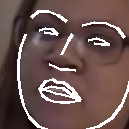

A face is located at pixel location Top: 139, Left: 758, Bottom: 325, Right: 944
The chin in this face has the following points: [(26, 55), (23, 77), (21, 99), (22, 122), (25, 144), (31, 165), (44, 178), (62, 186), (85, 187), (111, 187), (137, 186), (163, 182), (180, 168), (188, 147), (192, 123), (196, 99), (200, 75)]
The left_eyebrow in this face has the following points: [(40, 20), (50, 8), (64, 6), (79, 10), (91, 18)]
The right_eyebrow in this face has the following points: [(115, 16), (132, 9), (150, 7), (168, 12), (182, 24)]
The nose_bridge in this face has the following points: [(98, 36), (94, 46), (90, 55), (86, 65)]
The nose_tip in this face has the following points: [(75, 88), (82, 90), (89, 92), (99, 90), (109, 88)]
The left_eye in this face has the following points: [(54, 47), (62, 41), (72, 40), (83, 46), (72, 49), (62, 49)]
The right_eye in this face has the following points: [(129, 45), (141, 40), (152, 41), (162, 47), (151, 50), (140, 48)]
The top_lip in this face has th

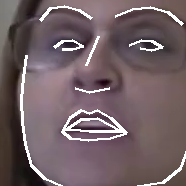

A face is located at pixel location Top: 614, Left: 580, Bottom: 769, Right: 734
The chin in this face has the following points: [(9, 54), (7, 72), (7, 90), (8, 108), (14, 125), (22, 140), (35, 151), (51, 156), (70, 156), (89, 156), (108, 152), (126, 145), (140, 132), (148, 116), (153, 98), (154, 80), (154, 61)]
The left_eyebrow in this face has the following points: [(16, 34), (23, 24), (36, 19), (51, 19), (65, 23)]
The right_eyebrow in this face has the following points: [(84, 24), (99, 20), (114, 19), (128, 24), (137, 35)]
The nose_bridge in this face has the following points: [(73, 39), (71, 48), (70, 57), (68, 67)]
The nose_tip in this face has the following points: [(55, 83), (62, 85), (69, 86), (77, 85), (85, 84)]
The left_eye in this face has the following points: [(28, 44), (36, 39), (45, 39), (54, 45), (45, 46), (35, 47)]
The right_eye in this face has the following points: [(95, 45), (104, 40), (114, 41), (122, 46), (114, 48), (104, 47)]
The top_lip in this face has the foll

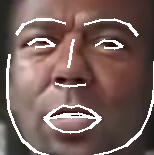

A face is located at pixel location Top: 192, Left: 885, Bottom: 415, Right: 1108
The chin in this face has the following points: [(8, 87), (11, 114), (15, 140), (22, 164), (32, 187), (50, 207), (74, 220), (102, 226), (128, 226), (153, 223), (171, 209), (186, 190), (195, 167), (199, 144), (201, 119), (201, 95), (199, 72)]
The left_eyebrow in this face has the following points: [(34, 60), (47, 48), (65, 42), (84, 42), (102, 47)]
The right_eyebrow in this face has the following points: [(132, 45), (146, 38), (162, 34), (178, 36), (189, 47)]
The nose_bridge in this face has the following points: [(119, 66), (122, 81), (124, 96), (127, 112)]
The nose_tip in this face has the following points: [(104, 129), (115, 131), (126, 133), (135, 130), (143, 126)]
The left_eye in this face has the following points: [(54, 76), (64, 69), (77, 68), (88, 75), (77, 78), (65, 79)]
The right_eye in this face has the following points: [(142, 71), (153, 62), (165, 61), (174, 68), (166, 72), (154, 73)]
The top_

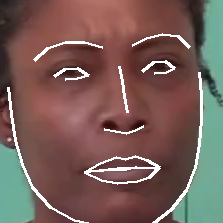

The chin in this face has the following points: [(8, 87), (11, 114), (15, 140), (22, 164), (32, 187), (50, 207), (74, 220), (102, 226), (128, 226), (153, 223), (171, 209), (186, 190), (195, 167), (199, 144), (201, 119), (201, 95), (199, 72)]
The left_eyebrow in this face has the following points: [(34, 60), (47, 48), (65, 42), (84, 42), (102, 47)]
The right_eyebrow in this face has the following points: [(132, 45), (146, 38), (162, 34), (178, 36), (189, 47)]
The nose_bridge in this face has the following points: [(119, 66), (122, 81), (124, 96), (127, 112)]
The nose_tip in this face has the following points: [(104, 129), (115, 131), (126, 133), (135, 130), (143, 126)]
The left_eye in this face has the following points: [(54, 76), (64, 69), (77, 68), (88, 75), (77, 78), (65, 79)]
The right_eye in this face has the following points: [(142, 71), (153, 62), (165, 61), (174, 68), (166, 72), (154, 73)]
The top_lip in this face has the following points: [(84, 172), (100, 163), (116, 157), (12

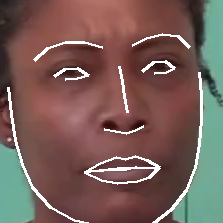

In [ ]:
for i in range(30):
    d1 = {'video':[], 'chin': [],'left_eyebrow':[],'right_eyebrow':[],'nose_bridge':[],'nose_tip':[],'left_eye':[],'right_eye':[],'top_lip':[],'bottom_lip':[], 'label': []}
    d1["video"].append(complete[i])
    video_file = complete[i]
    cap = cv.VideoCapture(video_file)
    success, image = cap.read()
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    cap.release()   
    face_locations = face_recognition.face_locations(image)
    for face_location in face_locations:
        # Print the location of each face in this image
        top, right, bottom, left = face_location
        print("A face is located at pixel location Top: {}, Left: {}, Bottom: {}, Right: {}".format(top, left, bottom, right))
        # You can access the actual face itself like this:
        face_image = image[top:bottom, left:right]
    face_landmarks_list = face_recognition.face_landmarks(face_image)
    pil_image = Image.fromarray(face_image)
    d = ImageDraw.Draw(pil_image)
    for face_landmarks in face_landmarks_list:
        # Print the location of each facial feature in this image
        for facial_feature in face_landmarks.keys():
            print("The {} in this face has the following points: {}".format(facial_feature, face_landmarks[facial_feature]))
            d1[facial_feature].append(face_landmarks[facial_feature])
        # Let's trace out each facial feature in the image with a line!
        for facial_feature in face_landmarks.keys():
            d.line(face_landmarks[facial_feature], width=3)
    # Show the picture
    display(pil_image)
    for j in range(400):
        if(data.iloc[j]['videos']==complete[i]):
            d1['label'].append(data.iloc[j]['label'])
            break
    try:
      d1 = pd.DataFrame(data=d1)
      dfinal = dfinal.append(d1, ignore_index=True)   
    except:
      continue
    

In [ ]:
dfinal.head(30)

,video,chin,left_eyebrow,right_eyebrow,nose_bridge,nose_tip,left_eye,right_eye,top_lip,bottom_lip,label
0,apatcsqejh.mp4,"[(-2, 56), (-1, 75), (-1, 94), (1, 112), (6, 1...","[(14, 36), (25, 27), (40, 26), (56, 28), (70, ...","[(84, 37), (96, 34), (107, 33), (117, 35), (12...","[(78, 48), (79, 58), (80, 68), (82, 79)]","[(65, 91), (72, 92), (78, 94), (83, 94), (87, ...","[(31, 48), (39, 45), (48, 45), (55, 50), (47, ...","[(90, 53), (99, 49), (107, 51), (112, 56), (10...","[(45, 119), (58, 113), (70, 110), (76, 113), (...","[(94, 124), (87, 126), (80, 126), (73, 126), (...",FAKE
1,apgjqzkoma.mp4,"[(20, 84), (19, 103), (21, 123), (25, 142), (3...","[(30, 51), (39, 40), (53, 36), (68, 37), (81, ...","[(107, 41), (122, 34), (140, 32), (157, 37), (...","[(92, 58), (91, 68), (90, 78), (89, 89)]","[(77, 108), (84, 109), (91, 110), (99, 109), (...","[(46, 69), (55, 64), (65, 63), (75, 68), (65, ...","[(119, 66), (130, 60), (141, 60), (150, 66), (...","[(67, 146), (74, 132), (84, 126), (91, 128), (...","[(128, 146), (115, 152), (102, 153), (93, 153)...",FAKE
2,apogckdfrz.mp4,"[(13, 118), (15, 137), (18, 156), (23, 175), (...","[(23, 64), (32, 49), (47, 41), (64, 40), (79, ...","[(109, 39), (126, 29), (147, 29), (167, 36), (...","[(95, 59), (95, 69), (95, 78), (94, 88)]","[(82, 121), (91, 121), (99, 119), (109, 119), ...","[(38, 83), (48, 74), (62, 71), (75, 78), (63, ...","[(126, 72), (139, 64), (153, 63), (165, 71), (...","[(68, 168), (79, 149), (91, 139), (101, 140), ...","[(146, 160), (131, 169), (116, 175), (104, 177...",FAKE
3,arkroixhey.mp4,"[(24, 83), (21, 105), (19, 127), (20, 149), (2...","[(36, 49), (43, 35), (58, 28), (74, 30), (88, ...","[(113, 34), (135, 27), (158, 28), (179, 37), (...","[(97, 53), (93, 63), (88, 72), (84, 82)]","[(73, 104), (79, 106), (86, 107), (96, 106), (...","[(52, 65), (60, 57), (71, 56), (82, 62), (71, ...","[(129, 63), (142, 57), (154, 58), (166, 67), (...","[(62, 150), (67, 128), (78, 119), (86, 120), (...","[(126, 154), (110, 162), (95, 164), (85, 164),...",FAKE
4,ajwpjhrbcv.mp4,"[(12, 43), (12, 58), (13, 72), (15, 87), (19, ...","[(19, 27), (25, 20), (34, 19), (44, 20), (53, ...","[(71, 23), (82, 19), (95, 17), (107, 20), (115...","[(62, 35), (61, 44), (60, 52), (59, 61)]","[(51, 71), (55, 73), (60, 74), (66, 73), (71, ...","[(31, 39), (36, 35), (43, 35), (50, 39), (43, ...","[(80, 39), (87, 34), (94, 35), (101, 38), (94,...","[(42, 96), (49, 91), (55, 88), (60, 89), (66, ...","[(83, 96), (74, 99), (66, 100), (61, 100), (56...",FAKE
5,aklqzsddfl.mp4,"[(-2, 54), (-4, 77), (-3, 101), (0, 125), (9, ...","[(19, 28), (33, 19), (50, 18), (67, 21), (81, ...","[(107, 32), (123, 27), (139, 26), (154, 30), (...","[(93, 48), (93, 64), (93, 78), (93, 94)]","[(70, 105), (80, 109), (91, 112), (102, 110), ...","[(35, 47), (46, 43), (58, 44), (68, 51), (57, ...","[(116, 55), (127, 50), (139, 52), (149, 58), (...","[(49, 135), (65, 129), (81, 127), (90, 130), (...","[(128, 137), (114, 147), (100, 152), (88, 152)...",FAKE
6,aknbdpmgua.mp4,"[(35, 98), (35, 127), (39, 157), (44, 186), (5...","[(50, 63), (59, 46), (77, 38), (96, 41), (114,...","[(160, 48), (179, 39), (201, 35), (221, 41), (...","[(136, 80), (135, 96), (134, 111), (133, 127)]","[(111, 151), (123, 154), (135, 156), (149, 153...","[(69, 92), (81, 84), (97, 84), (111, 93), (97,...","[(170, 91), (184, 82), (200, 81), (213, 89), (...","[(92, 203), (107, 187), (125, 179), (137, 181)...","[(189, 200), (172, 224), (151, 233), (138, 235...",FAKE
7,aknmpoonls.mp4,"[(22, 100), (27, 122), (33, 144), (41, 164), (...","[(29, 66), (36, 50), (50, 41), (67, 38), (82, ...","[(114, 37), (129, 29), (147, 26), (165, 30), (...","[(101, 66), (102, 80), (104, 92), (105, 106)]","[(91, 125), (100, 127), (110, 127), (120, 123)...","[(48, 87), (57, 80), (68, 77), (80, 80), (70, ...","[(130, 71), (140, 65), (151, 64), (163, 67), (...","[(84, 171), (93, 156), (104, 148), (113, 148),...","[(152, 159), (141, 172), (127, 179), (118, 181...",FAKE
8,akvmwkdyuv.mp4,"[(17, 50), (17, 63)

In [ ]:
dfinal.to_excel('final.xlsx', sheet_name = 'New_sheet')

In [ ]:
files.download('final.xlsx')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# ***Real and Fake Lamdmarks Comparison***

In [ ]:
!kaggle competitions download -c deepfake-detection-challenge -f /train_sample_videos/aneclqfpbt.mp4
!kaggle competitions download -c deepfake-detection-challenge -f /test_sample_videos/anpuvshzoo.mp4

complete = ['aneclqfpbt.mp4', 'anpuvshzoo.mp4']

In [ ]:
for i in range(2):
    d1 = {'video':[], 'chin': [],'left_eyebrow':[],'right_eyebrow':[],'nose_bridge':[],'nose_tip':[],'left_eye':[],'right_eye':[],'top_lip':[],'bottom_lip':[], 'label': []}
    d1["video"].append(complete[i])
    video_file = complete[i]
    cap = cv.VideoCapture(video_file)
    success, image = cap.read()
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    cap.release()   
    face_locations = face_recognition.face_locations(image)
    for face_location in face_locations:
        # Print the location of each face in this image
        top, right, bottom, left = face_location
        print("A face is located at pixel location Top: {}, Left: {}, Bottom: {}, Right: {}".format(top, left, bottom, right))
        # You can access the actual face itself like this:
        face_image = image[top:bottom, left:right]
    face_landmarks_list = face_recognition.face_landmarks(face_image)
    pil_image = Image.fromarray(face_image)
    d = ImageDraw.Draw(pil_image)
    for face_landmarks in face_landmarks_list:
        # Print the location of each facial feature in this image
        for facial_feature in face_landmarks.keys():
            print("The {} in this face has the following points: {}".format(facial_feature, face_landmarks[facial_feature]))
            d1[facial_feature].append(face_landmarks[facial_feature])
        # Let's trace out each facial feature in the image with a line!
        for facial_feature in face_landmarks.keys():
            d.line(face_landmarks[facial_feature], width=3)
    # Show the picture
    display(pil_image)
    for j in range(400):
        if(data.iloc[j]['videos']==complete[i]):
            d1['label'].append(data.iloc[j]['label'])
            break
    try:
      d1 = pd.DataFrame(data=d1)
      dfinal = dfinal.append(d1, ignore_index=True)   
    except:
      continue

***FIRST OUTPUT IS FAKE AND SECOND IS REAL***

In [ ]:
dfinal.head()

# ***Attempt at Detection using the Inception Resnet***

In [3]:
import os
import glob
import torch
import cv2
from PIL import Image
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

# See github.com/timesler/facenet-pytorch:
from facenet_pytorch import MTCNN, InceptionResnetV1

device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
print(f'Running on device: {device}')

Running on device: cuda:0


In [2]:
!pip install facenet_pytorch

     |████████████████████████████████| 1.9MB 7.5MB/s 


In [4]:
# Load face detector
mtcnn = MTCNN(device=device).eval()

# Load facial recognition model
resnet = InceptionResnetV1(pretrained='vggface2', num_classes=2, device=device).eval()

In [ ]:
#filenames = glob.glob('*.mp4')

In [8]:
# Get all test videos
filenames = complete

# Number of frames to sample (evenly spaced) from each video
n_frames = 10

X = []
with torch.no_grad():
    for i, filename in enumerate(filenames):
        print(f'Processing {i+1:5n} of {len(filenames):5n} videos\r', end='')
        
        try:
            # Create video reader and find length
            v_cap = cv2.VideoCapture(filename)
            v_len = int(v_cap.get(cv2.CAP_PROP_FRAME_COUNT))
            
            # Pick 'n_frames' evenly spaced frames to sample
            sample = np.linspace(0, v_len - 1, n_frames).round().astype(int)
            imgs = []
            for j in range(v_len):
                success, vframe = v_cap.read()
                vframe = cv2.cvtColor(vframe, cv2.COLOR_BGR2RGB)
                if j in sample:
                    imgs.append(Image.fromarray(vframe))
            v_cap.release()
            
            # Pass image batch to MTCNN as a list of PIL images
            faces = mtcnn(imgs)
            
            # Filter out frames without faces
            faces = [f for f in faces if f is not None]
            faces = torch.stack(faces).to(device)
            
            # Generate facial feature vectors using a pretrained model
            embeddings = resnet(faces)
            
            # Calculate centroid for video and distance of each face's feature vector from centroid
            centroid = embeddings.mean(dim=0)
            X.append((embeddings - centroid).norm(dim=1).cpu().numpy())
        except KeyboardInterrupt:
            raise Exception("Stopped.")
        except:
            X.append(None)

In [9]:
bias = -0.4
weight = 0.068235746

submission = []
for filename, x_i in zip(filenames, X):
    if x_i is not None and len(x_i) == 10:
        prob = 1 / (1 + np.exp(-(bias + (weight * x_i).sum())))
    else:
        prob = 0.6
    submission.append([os.path.basename(filename), prob])

In [10]:
submission = pd.DataFrame(submission, columns=['filename', 'label'])
submission.sort_values('filename').to_csv('submission.csv', index=False)

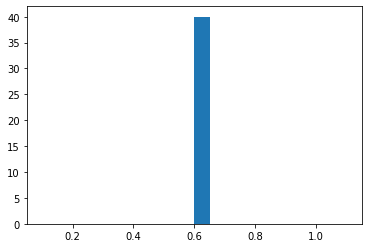

,filename,label
0,abarnvbtwb.mp4,0.6
1,aelfnikyqj.mp4,0.6
2,afoovlsmtx.mp4,0.6
3,agrmhtjdlk.mp4,0.6
4,ahqqqilsxt.mp4,0.6
5,ajqslcypsw.mp4,0.6
6,anpuvshzoo.mp4,0.6
7,asaxgevnnp.mp4,0.6
8,atkdltyyen.mp4,0.6
9,atvmxvwyns.mp4,0.6


In [11]:
plt.hist(submission.label, 20)
plt.show()
submission

In [12]:
s = submission[submission['label']>0.5]

In [13]:
s

,filename,label
0,abarnvbtwb.mp4,0.6
1,aelfnikyqj.mp4,0.6
2,afoovlsmtx.mp4,0.6
3,agrmhtjdlk.mp4,0.6
4,ahqqqilsxt.mp4,0.6
5,ajqslcypsw.mp4,0.6
6,anpuvshzoo.mp4,0.6
7,asaxgevnnp.mp4,0.6
8,atkdltyyen.mp4,0.6
9,atvmxvwyns.mp4,0.6


In [23]:
result = ["apatcsqejh.mp4", "andaxzscny.mp4", "abofeumbvv.mp4", "adhsbajydo.mp4", "agrmhtjdlk.mp4", "atvmxvwyns.mp4"]
for i in result:
    for j in range(400):
            if(data.iloc[j]['videos']==i):
                print(data.iloc[j]['label'])

FAKE
FAKE
FAKE
FAKE
REAL
REAL


In [24]:
s1 = submission[submission['label']<0.5]

In [25]:
s1 = s1['filename'].values

In [27]:
result = s1
for i in result:
    for j in range(400):
            if(data.iloc[j]['videos']==i):
                print(data.iloc[j]['label'])